# EDA Fitzpatrick

This file contains EDA for the fitzpatrick17k dataset

In [1]:
from google.cloud import storage
import io
from PIL import Image
import pandas as pd
from io import StringIO, BytesIO
import requests
import re
import matplotlib.pyplot as plt
import concurrent.futures
from tqdm import tqdm
from urllib.parse import urlparse
import random

In [2]:
client = storage.Client()
bucket = client.bucket('derma-datasets-2')

In [3]:
def view_image(path, bucket):
    blob = bucket.blob(path)
    img_bytes = blob.download_as_bytes()
    img = Image.open(BytesIO(img_bytes))
    img.show()

In [4]:
fitz_csv_blob = bucket.blob('raw/fitzpatrick17k/fitzpatrick17k.csv')
fitz_csv_data = fitz_csv_blob.download_as_text()
fitz_csv = pd.read_csv(StringIO(fitz_csv_data))

In [5]:
fitz_csv.head()

,md5hash,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum
0,5e82a45bc5d78bd24ae9202d194423f8,3,3,drug induced pigmentary changes,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicmminoc...
1,fa2911a9b13b6f8af79cb700937cc14f,1,1,photodermatoses,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicpphoto...
2,d2bac3c9e4499032ca8e9b07c7d3bc40,2,3,dermatofibroma,benign dermal,benign,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicdderma...
3,0a94359e7eaacd7178e06b2823777789,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...
4,a39ec3b1f22c08a421fa20535e037bba,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...


In [6]:
fitz_csv.shape

(16577, 9)

## Number of Images that Succeeded

Not all the images were able to be successfully uploaded to the bucket. Here, I will investigate how many images we actually have in the bucket.

In [7]:
image_blobs = bucket.list_blobs(prefix="raw/fitzpatrick17k/images")

image_filenames = []
for blob in image_blobs:
    image_filenames.append(blob.name)

print(f"Number of images we were able to access: {len(image_filenames)}")
print(f"Number of images in the original dataset: {fitz_csv.shape[0]}")
print(f"Percentage of images we have: {len(image_filenames) / fitz_csv.shape[0] * 100}%")

Number of images we were able to access: 3905
Number of images in the original dataset: 16577
Percentage of images we have: 23.556735235567352%


Yikes! That is not many images! :(

## Statistics on Images we Have:

I will first run EDA on the images we do have.

In [8]:
# get image hashes we have
image_filenames_ser = pd.Series(image_filenames)
image_hashes = image_filenames_ser.str.replace("raw/fitzpatrick17k/images/", "")
image_hashes = image_hashes.apply(lambda x: re.sub(r'\.[^/.]+$', '', x))

# filter metadata to only include images we have
fitz_csv_filt_tmp = fitz_csv[fitz_csv['md5hash'].isin(image_hashes)]
print(fitz_csv_filt_tmp.shape)
fitz_csv_filt_tmp.head()

(3905, 9)


,md5hash,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum
12672,119d712798a653799adaf8e5e08ce66e,4,3,hailey hailey disease,genodermatoses,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=2409,httpwwwatlasdermatologicocombrimgimageId2409.jpg
12673,23575178ed245ee186aa5f64c94b48d9,3,3,papilomatosis confluentes and reticulate,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=5060,httpwwwatlasdermatologicocombrimgimageId5060.jpg
12674,8afc38b0f9946c000acd5f36e0c85642,2,5,scabies,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=4898,httpwwwatlasdermatologicocombrimgimageId4898.jpg
12675,89e55bbc7452d465218e6c6723c07ce0,2,3,tuberous sclerosis,genodermatoses,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=7598,httpwwwatlasdermatologicocombrimgimageId7598.jpg
12676,c78bde4a058f64a6d2fe762ae2800176,3,4,keloid,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=2969,httpwwwatlasdermatologicocombrimgimageId2969.jpg


In [9]:
# add filenames to fitz_csv_filt
image_filenames_ser.index = image_hashes
image_filenames_ser.name = "filepath"

fitz_csv_filt = fitz_csv_filt_tmp.set_index('md5hash')
fitz_csv_filt = fitz_csv_filt.join(image_filenames_ser)

fitz_csv_filt.head()

,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum,filepath
md5hash,,,,,,,,,
119d712798a653799adaf8e5e08ce66e,4,3,hailey hailey disease,genodermatoses,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=2409,httpwwwatlasdermatologicocombrimgimageId2409.jpg,raw/fitzpatrick17k/images/119d712798a653799ada...
23575178ed245ee186aa5f64c94b48d9,3,3,papilomatosis confluentes and reticulate,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=5060,httpwwwatlasdermatologicocombrimgimageId5060.jpg,raw/fitzpatrick17k/images/23575178ed245ee186aa...
8afc38b0f9946c000acd5f36e0c85642,2,5,scabies,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=4898,httpwwwatlasdermatologicocombrimgimageId4898.jpg,raw/fitzpatrick17k/images/8afc38b0f9946c000acd...
89e55bbc7452d465218e6c6723c07ce0,2,3,tuberous sclerosis,genodermatoses,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=7598,httpwwwatlasdermatologicocombrimgimageId7598.jpg,raw/fitzpatrick17k/images/89e55bbc7452d465218e...
c78bde4a058f64a6d2fe762ae2800176,3,4,keloid,inflammatory,non-neoplastic,NaN,http://atlasdermatologico.com.br/img?imageId=2969,httpwwwatlasdermatologicocombrimgimageId2969.jpg,raw/fitzpatrick17k/images/c78bde4a058f64a6d2fe...


### Class Labels

Each image is labeled with:

* `fitzpatrick_scale`: its score on the Fitzpatrick scale (a six-point scale originally developed for classifying sun reactivity of skin phenotype; also classifies color of skin)
* `fitzpatrick_centaur`: I think this is the label assigned by their AI algorithm in their paper (https://arxiv.org/pdf/2104.09957), but I am not 100% sure
* `label`: the granular skin disease the image is labeled as
* `nine_partition_label`: a label based on a nine-partition scheme (less granular than the original labeling)
* `three_partition_label`: an even less granular labeling schema
* `qc`: 
* `url`: the link to the original image
* `url_alphanum`: the link to the original image, with special characters removed

Distinct labels and counts:
fitzpatrick_scale
Length: 7
fitzpatrick_scale
-1     153
 1     162
 2     660
 3    1003
 4    1087
 5     638
 6     202
Name: count, dtype: int64


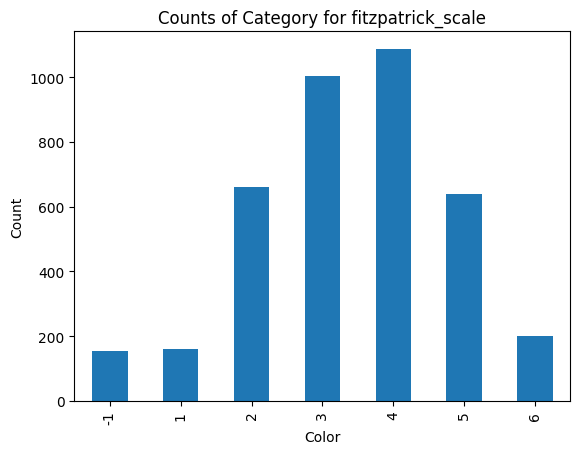

fitzpatrick_centaur
Length: 7
fitzpatrick_centaur
-1     295
 1     320
 2     532
 3    1141
 4     863
 5     551
 6     203
Name: count, dtype: int64


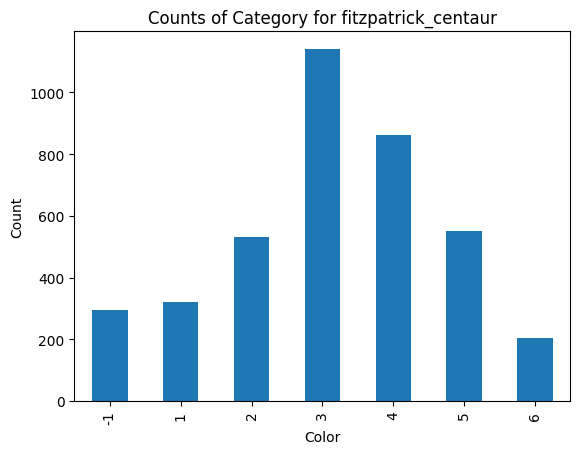

label
Length: 92
label
basal cell carcinoma        257
lichen planus               230
squamous cell carcinoma     212
pityriasis rubra pilaris    175
scabies                     138
                           ... 
congenital nevus              2
eczema                        2
paronychia                    2
epidermal nevus               2
lyme disease                  1
Name: count, Length: 92, dtype: int64


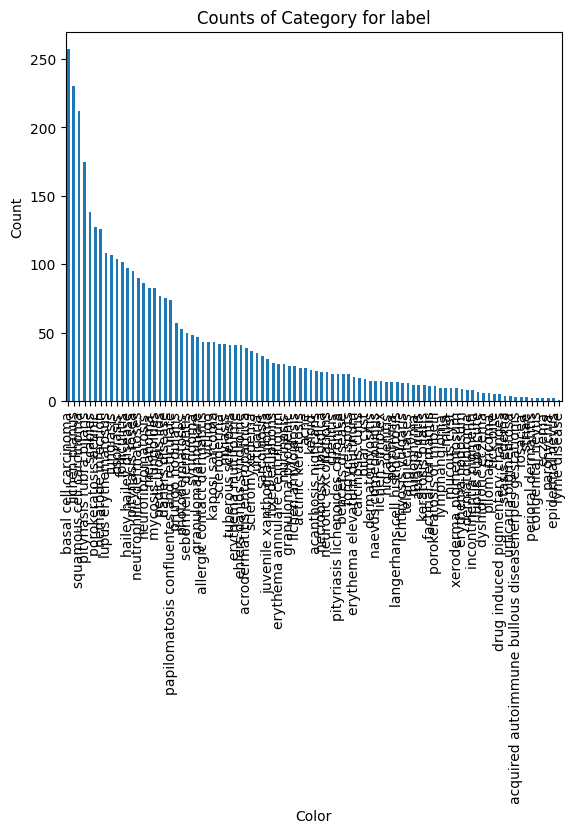

nine_partition_label
Length: 9
nine_partition_label
inflammatory                    2412
malignant epidermal              493
genodermatoses                   410
benign epidermal                 222
benign dermal                    157
malignant melanoma                83
malignant cutaneous lymphoma      83
malignant dermal                  43
benign melanocyte                  2
Name: count, dtype: int64


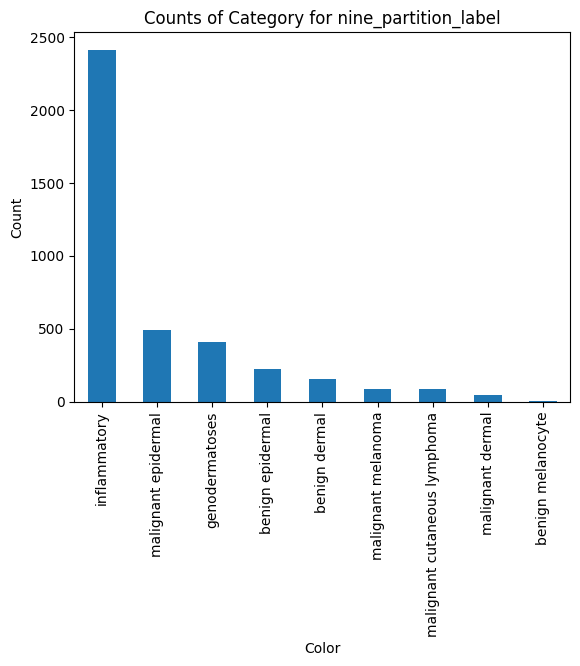

three_partition_label
Length: 3
three_partition_label
non-neoplastic    2822
malignant          702
benign             381
Name: count, dtype: int64


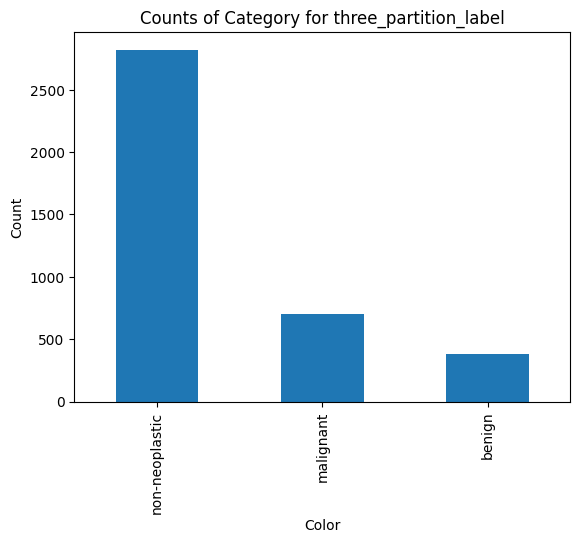

In [10]:
print("Distinct labels and counts:")

lab_cols = ['fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label']

for col in lab_cols:
    print(col)
    counts = fitz_csv_filt[col].value_counts(dropna=False)
    if col in ('fitzpatrick_scale', 'fitzpatrick_centaur'):
        counts = counts.sort_index()
    print(f"Length: {counts.shape[0]}")
    print(counts)
    counts.plot.bar()
    plt.xlabel('Color')
    plt.ylabel('Count')
    plt.title(f'Counts of Category for {col}')
    plt.show()


In [11]:
# check for missing data in labels
fitz_csv_filt[lab_cols].isna().any()

fitzpatrick_scale        False
fitzpatrick_centaur      False
label                    False
nine_partition_label     False
three_partition_label    False
dtype: bool

### URLs

In [12]:
# check for missing URLs (should be none since we filtered for only URLs that worked earlier)
fitz_csv_filt['url'].isna().any()

np.False_

In [13]:
# get all distinct image sources (domains)
url_domains = fitz_csv_filt['url'].apply(lambda x: urlparse(x).hostname)
url_domains.value_counts()

url
atlasdermatologico.com.br    3905
Name: count, dtype: int64

Yikes! Only one source worked!

### Quality Control

A subset of the images were labeled by a board certified dermatologist as:

* `Diagnostic`: image allows for diagnosis of the condition
* `potentially diagnostic` not clearly diagnostic but not necessarily mislabeled, further testing would be required
* `characteristic` (resembling the appearance of such a condition but not clearly diagnostic
* `wrongly labeled`: label is wrong
* `other`: the documentation did not explain what this means, but presumably it means not in any other categories

**Note:** `other` is different from `NA`. `NA` means the dermatologist did not see the image. `other` means the dermatologist saw it and it did not fit any other category.

Of the 3905 images we had access to, 131 were seen by the dermatologist (3.354673495518566%)
Length: 6
qc
NaN                   3774
1 Diagnostic           104
5 Potentially           21
3 Wrongly labelled       3
2 Characteristic         2
4 Other                  1
Name: count, dtype: int64


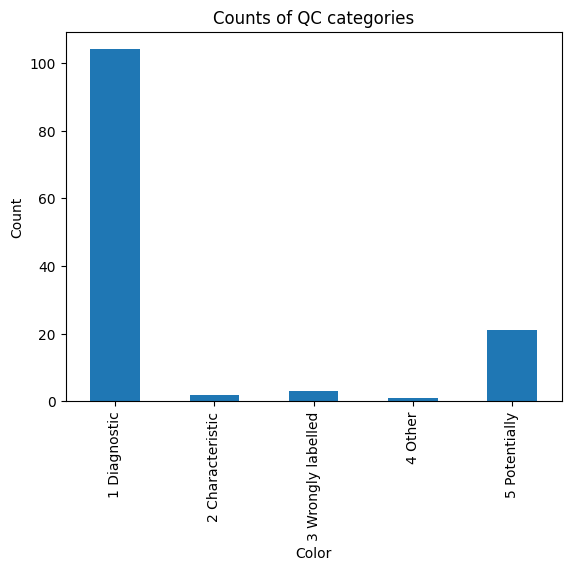

In [14]:
# distinct QC values
qc_counts = fitz_csv_filt['qc'].value_counts(dropna=False)
qc_counts_nona = fitz_csv_filt['qc'].value_counts()
qc_counts_nona = qc_counts_nona.sort_index()

print(f"Of the {fitz_csv_filt.shape[0]} images we had access to, {sum(qc_counts_nona)} were seen by the dermatologist ({sum(qc_counts_nona)/fitz_csv_filt.shape[0] * 100}%)")

print(f"Length: {qc_counts.shape[0]}")
print(qc_counts)
qc_counts_nona.plot.bar()
plt.xlabel('Color')
plt.ylabel('Count')
plt.title(f'Counts of QC categories')
plt.show()

### Image Properties

#### Image File Format

In [15]:
# check file types of images
image_extensions = image_filenames_ser.apply(lambda x: x.split('.')[1])
image_extensions.value_counts()

filepath
jpg    3887
png      18
Name: count, dtype: int64

#### Image Sizes, Dimensions, and Color Channels

In [16]:
# need to reload blobs since iterator has already run above
image_blobs = bucket.list_blobs(prefix="raw/fitzpatrick17k/images")


def process_blob(blob):

    img_filename = blob.name
    
    # get md5 hash
    filename_no_prefix = img_filename.replace("raw/fitzpatrick17k/images/", "")
    md5 = re.sub(r'\.[^/.]+$', '', filename_no_prefix)
    
    file_size = blob.size

    # load image content into memory
    img_bytes = blob.download_as_bytes()
    try:
        with Image.open(io.BytesIO(img_bytes)) as img:
            # get width and height
            width, height = img.size

            # Get channels: 'L' = 1, 'RGB' = 3, 'RGBA' = 4, etc.
            mode = img.mode
            channels = len(img.getbands())
    except Exception as e:
        width, height, channels, mode = None, None, None, None

    return {
        'md5hash': md5,
        'filename': blob.name,
        'filesize_kb': file_size * 0.001,
        'width': width,
        'height': height,
        'channels': channels,
        'mode': mode,
    }

results = []
with concurrent.futures.ThreadPoolExecutor(max_workers=4) as executor:
    for res in tqdm(executor.map(process_blob, image_blobs), total=len(image_filenames)):
        results.append(res)

# create DataFrame
img_props = pd.DataFrame(results)
img_props.set_index('md5hash', inplace=True)

100%|██████████████████████████████████████████████████████████████████████| 3905/3905 [01:49<00:00, 35.51it/s]


In [17]:
img_props.head()

,filename,filesize_kb,width,height,channels,mode
md5hash,,,,,,
000e8dd5ee75dd6668e978e7a4e6fe54,raw/fitzpatrick17k/images/000e8dd5ee75dd6668e9...,101.912,460,385,3,RGB
001b1edd9c7a02e9381793f6e9081d20,raw/fitzpatrick17k/images/001b1edd9c7a02e93817...,60.226,490,360,3,RGB
002f4ec0b620339d58ccfa26c4268584,raw/fitzpatrick17k/images/002f4ec0b620339d58cc...,86.588,437,405,3,RGB
005c26fd71696854f7b4c9d80a5dc9d6,raw/fitzpatrick17k/images/005c26fd71696854f7b4...,25.703,425,259,3,RGB
0066264501f73b1db09b3e2aa4dac0a0,raw/fitzpatrick17k/images/0066264501f73b1db09b...,84.916,477,371,3,RGB


Distribution of image sizes:

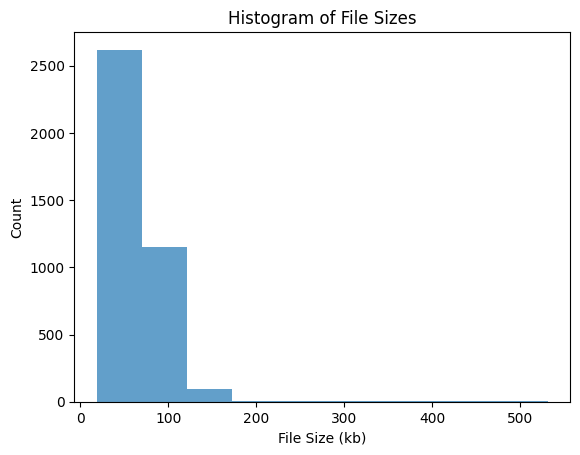

In [18]:
img_props['filesize_kb'].plot.hist(bins=10, alpha=0.7)
plt.xlabel('File Size (kb)')
plt.ylabel('Count')
plt.title('Histogram of File Sizes')
plt.show()

Image Channels

In [19]:
img_props['channels'].value_counts(dropna=False)

channels
3    3905
Name: count, dtype: int64

Image Color Mode

In [20]:
img_props['mode'].value_counts(dropna=False)

mode
RGB    3905
Name: count, dtype: int64

Image Sizes

Min filesize:
140a248b9e5eac724dfc891cee0069fa


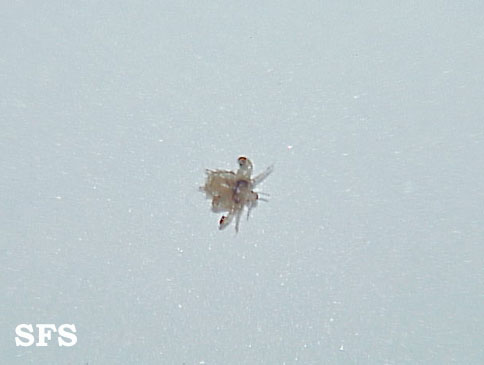

In [21]:
# check for min and max filesize (may indicate corrupted image)
min_size_hash = img_props['filesize_kb'].idxmin()
min_img_path = img_props.loc[min_size_hash, 'filename']

print("Min filesize:")
print(min_size_hash)

view_image(min_img_path, bucket)

Max filesize:
495130692b7ed3c7f9397d9c76e225e3


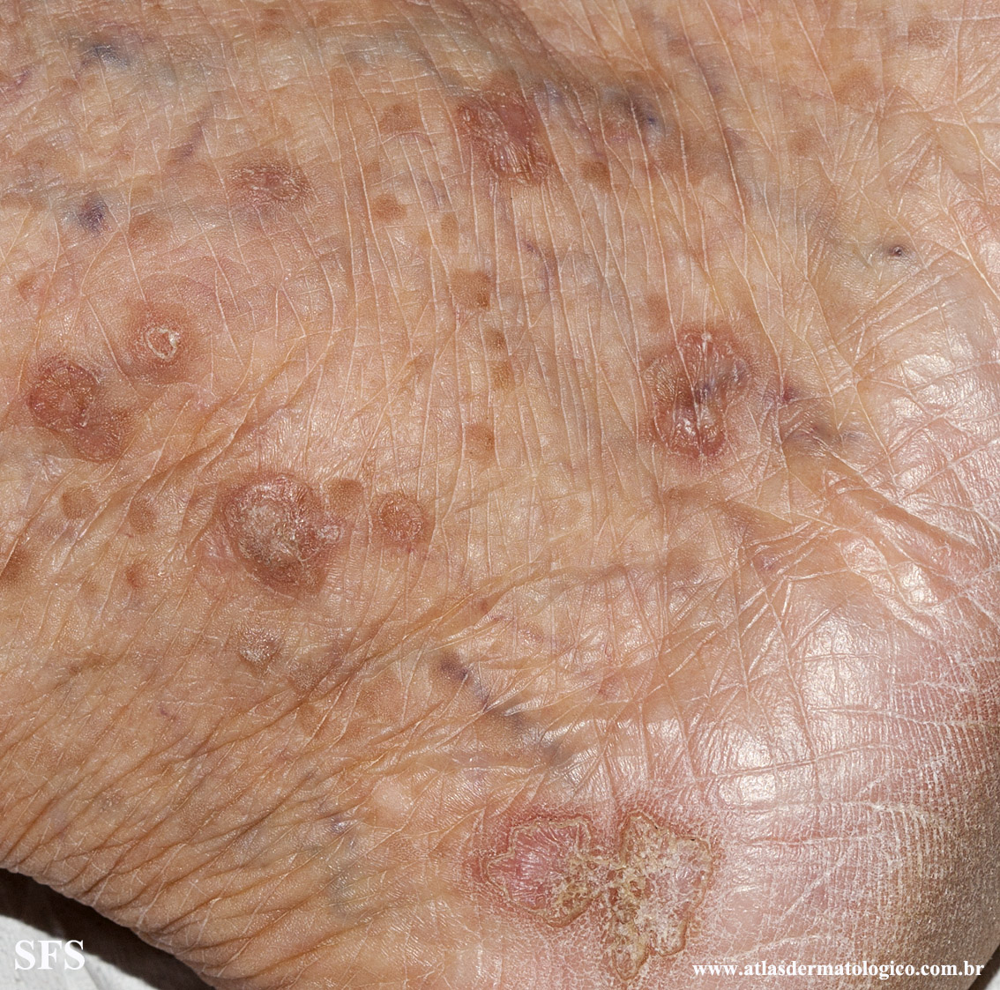

In [22]:
# check for min and max filesize (may indicate corrupted image)
max_size_hash = img_props['filesize_kb'].idxmax()
max_img_path = img_props.loc[max_size_hash, 'filename']

print("Max filesize:")
print(max_size_hash)

view_image(max_img_path, bucket)

In [23]:
# width height stats
print(img_props[['width', 'height']].describe())

             width       height
count  3905.000000  3905.000000
mean    472.920102   392.141869
std     122.506953    64.562988
min     177.000000   195.000000
25%     444.000000   364.000000
50%     469.000000   378.000000
75%     485.000000   400.000000
max    1920.000000  1123.000000


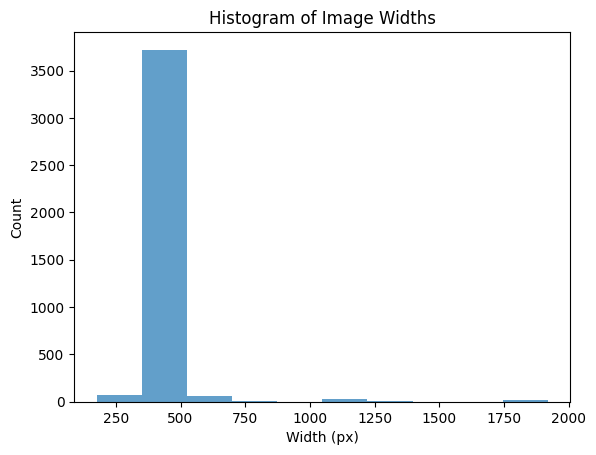

In [24]:
# histograms of widths and heights
img_props['width'].plot.hist(bins=10, alpha=0.7)
plt.xlabel('Width (px)')
plt.ylabel('Count')
plt.title('Histogram of Image Widths')
plt.show()

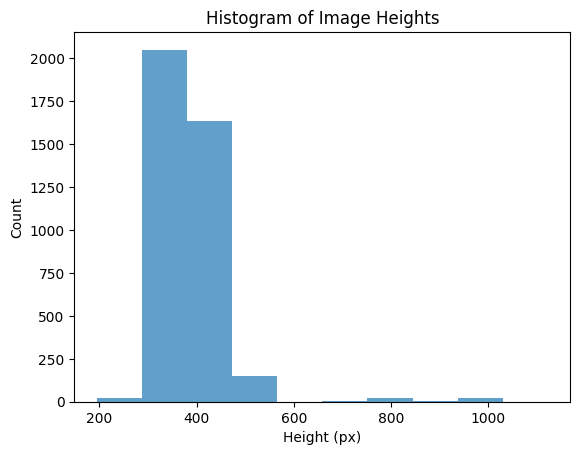

In [25]:
img_props['height'].plot.hist(bins=10, alpha=0.7)
plt.xlabel('Height (px)')
plt.ylabel('Count')
plt.title('Histogram of Image Heights')
plt.show()

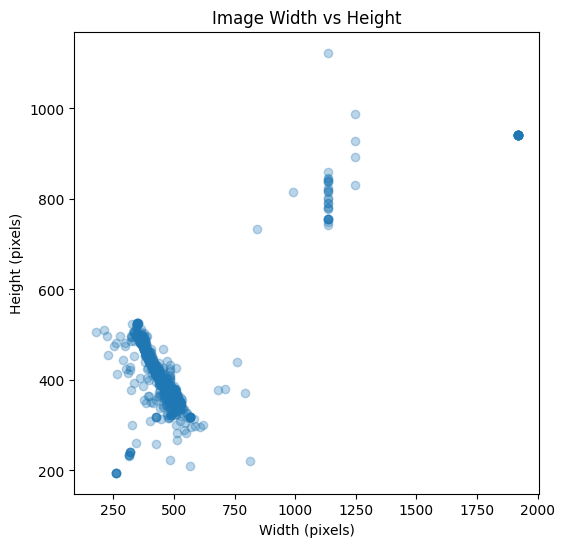

In [26]:
# histogram of width vs. height
plt.figure(figsize=(6,6))
plt.scatter(img_props['width'], img_props['height'], alpha=0.3)
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.title('Image Width vs Height')
plt.show()

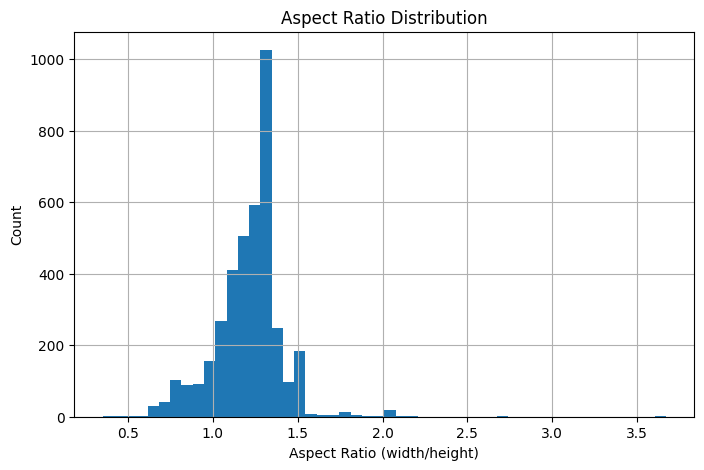

In [27]:
# histogram of aspect ratios
img_props['aspect_ratio'] = img_props['width'] / img_props['height']
img_props['aspect_ratio'].hist(bins=50, figsize=(8,5))
plt.title('Aspect Ratio Distribution')
plt.xlabel('Aspect Ratio (width/height)')
plt.ylabel('Count')
plt.show()

orientation
landscape    3269
portrait      363
square        273
Name: count, dtype: int64


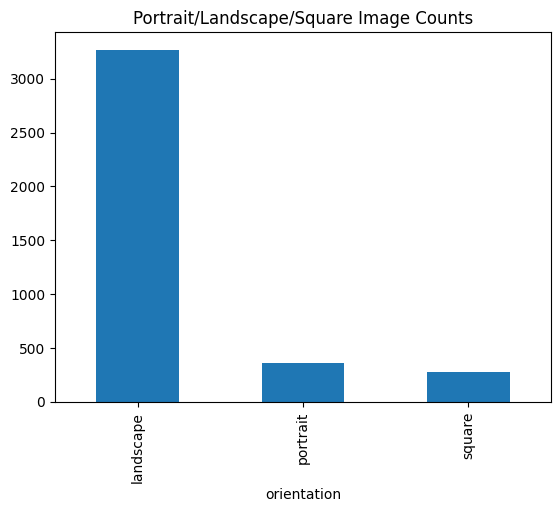

In [28]:
# cannonical proportions
sq_thresh = 0.05  # how close to 1 counts as square
img_props['orientation'] = img_props['aspect_ratio'].apply(
    lambda x: 'square' if abs(x-1)<sq_thresh else ('landscape' if x>1 else 'portrait'))

print(img_props['orientation'].value_counts())
img_props['orientation'].value_counts().plot(kind='bar')
plt.title('Portrait/Landscape/Square Image Counts')
plt.show()

In [29]:
# Smallest and largest images
print("Smallest images:")
print(img_props.nsmallest(5, 'width')[['width', 'height']])
print(img_props.nsmallest(5, 'height')[['width', 'height']])

print("Largest images:")
print(img_props.nlargest(5, 'width')[['width', 'height']])
print(img_props.nlargest(5, 'height')[['width', 'height']])

Smallest images:
                                  width  height
md5hash                                        
456fae3b6780fe417757c9d3cd902245    177     505
5410474f54e4f2dc9dcd09cb09613034    210     511
bb8d12e5519794134fc3aff9670a6ce2    225     496
b33801b74be02c85e6d9683331bc981a    227     456
c7a9b59f6d912d59b9141edeb7e4b586    255     476
                                  width  height
md5hash                                        
08904b2c711d4144603c07c8bf7bd5b7    260     195
1dc929c4a7deabf67edbce72e5750311    260     195
426bb69b179aa8e0d0ec9bb8d9a08093    260     195
574ea9e20e48a102ecb4300c1898cbf0    260     195
f93904a70e91281cd988fd6e166a470e    260     195
Largest images:
                                  width  height
md5hash                                        
033001225ab6fcdc1067b4a813484808   1920     941
05175d29ac2b49702ba01bc4952cdb1c   1920     941
10e0293479132f664253bb7820dbb67a   1920     941
26c26cac0f8cb4b9ac269d2dd1bcb2e4   1920     941
280c6c1

### Check for Duplicate Images

Check for exact duplicates (using hashes)

In [31]:
fitz_csv_filt = fitz_csv_filt.reset_index()
duplicate_md5 = fitz_csv_filt[fitz_csv_filt.duplicated('md5hash', keep=False)].sort_values('md5hash')
print("Exact duplicates found:")
print(duplicate_md5)

Exact duplicates found:
Empty DataFrame
Columns: [md5hash, fitzpatrick_scale, fitzpatrick_centaur, label, nine_partition_label, three_partition_label, qc, url, url_alphanum, filepath]
Index: []


## Visualize Random Images

Label type: fitzpatrick_scale
Label: 4


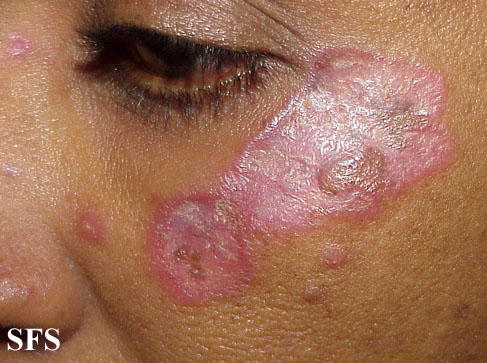

Label type: fitzpatrick_scale
Label: 3


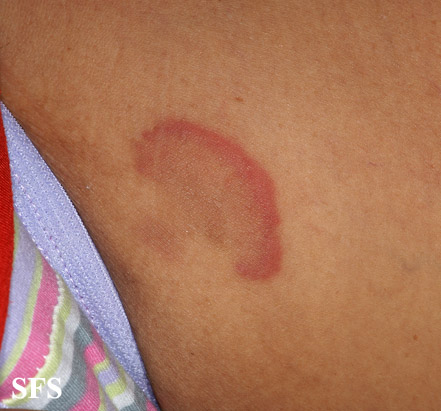

Label type: fitzpatrick_scale
Label: 2


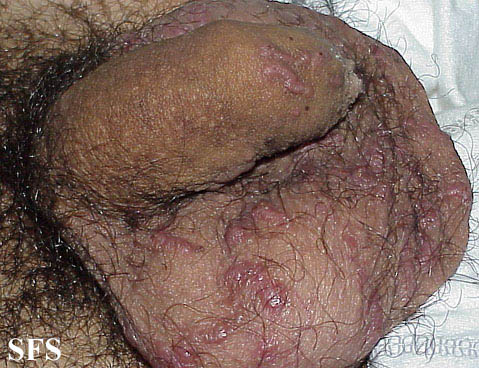

Label type: fitzpatrick_scale
Label: 1


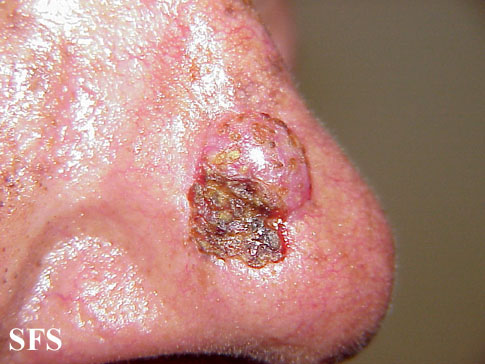

Label type: fitzpatrick_scale
Label: 5


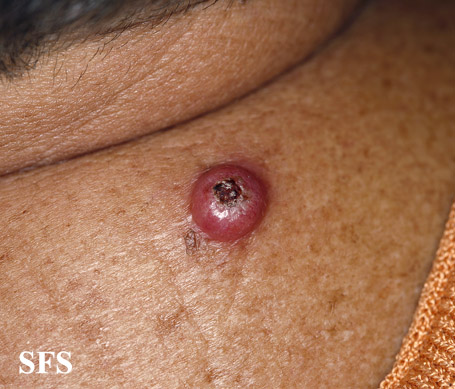

Label type: fitzpatrick_scale
Label: 6


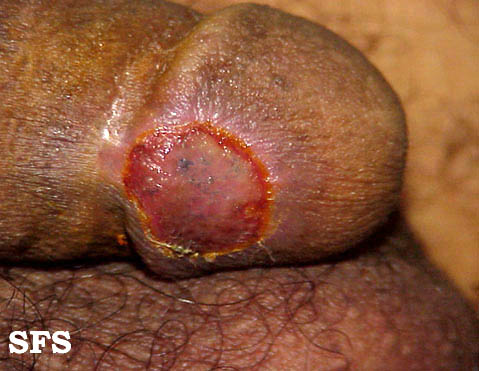

Label type: fitzpatrick_scale
Label: -1


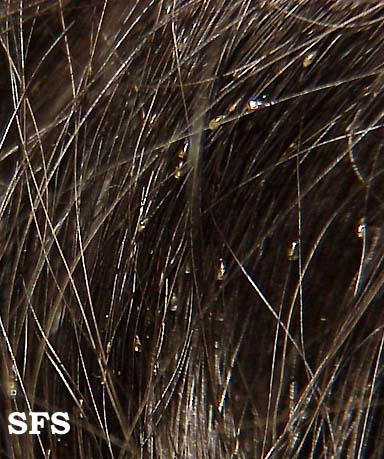

Label type: fitzpatrick_centaur
Label: 3


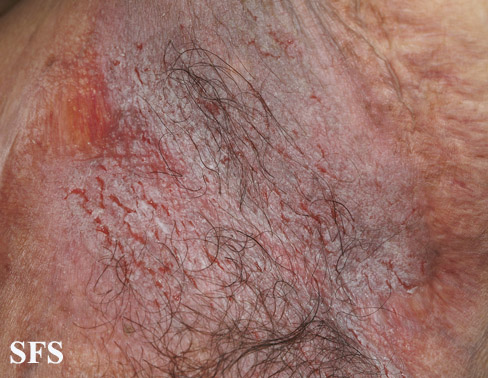

Label type: fitzpatrick_centaur
Label: 5


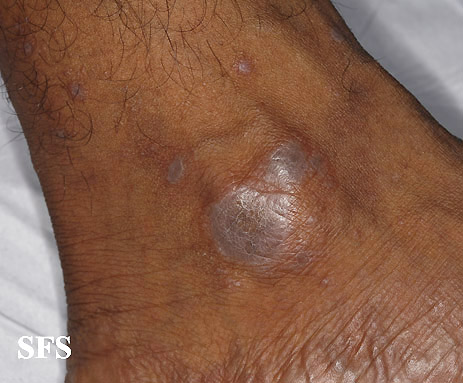

Label type: fitzpatrick_centaur
Label: 4


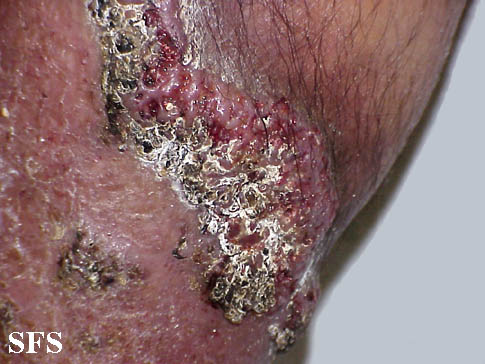

Label type: fitzpatrick_centaur
Label: 2


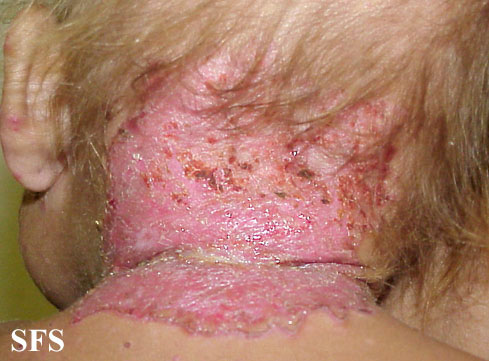

Label type: fitzpatrick_centaur
Label: -1


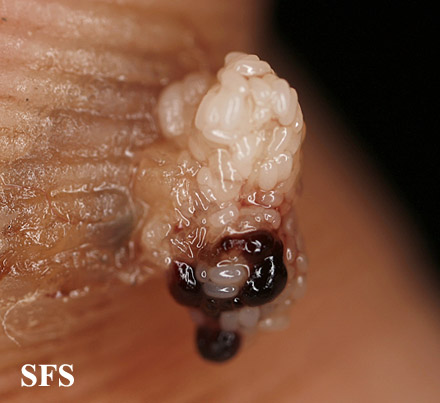

Label type: fitzpatrick_centaur
Label: 6


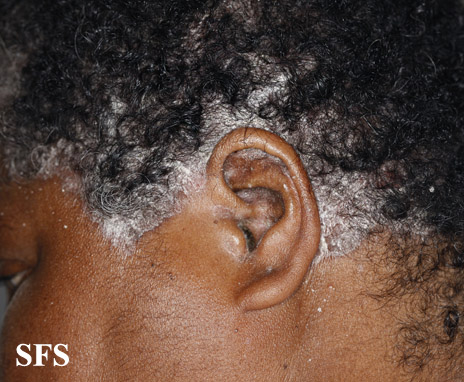

Label type: fitzpatrick_centaur
Label: 1


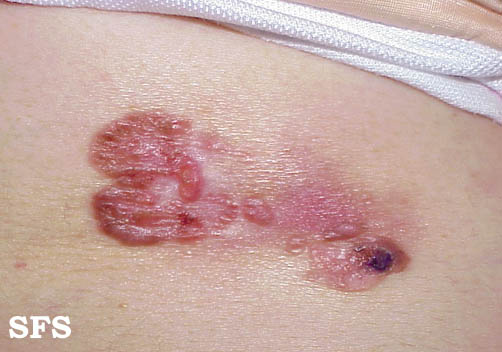

Label type: nine_partition_label
Label: genodermatoses


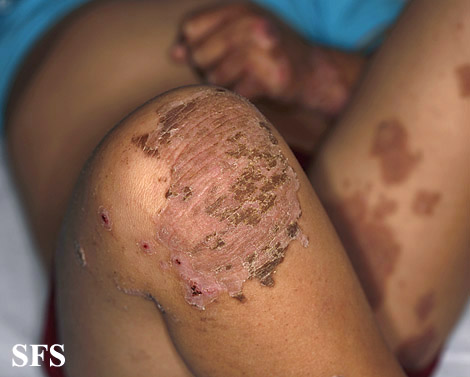

Label type: nine_partition_label
Label: inflammatory


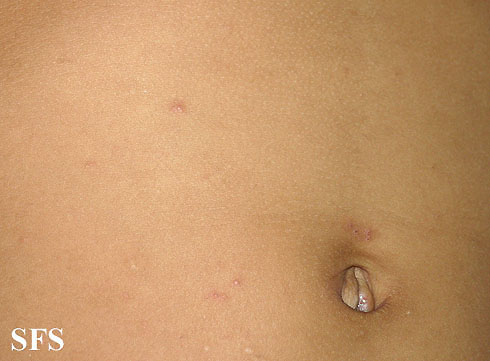

Label type: nine_partition_label
Label: benign dermal


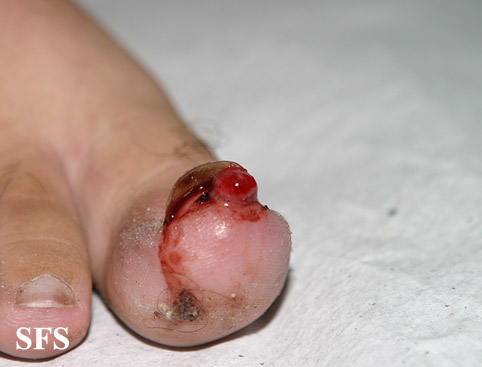

Label type: nine_partition_label
Label: malignant melanoma


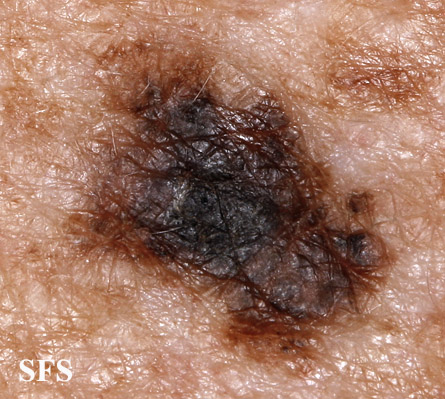

Label type: nine_partition_label
Label: malignant epidermal


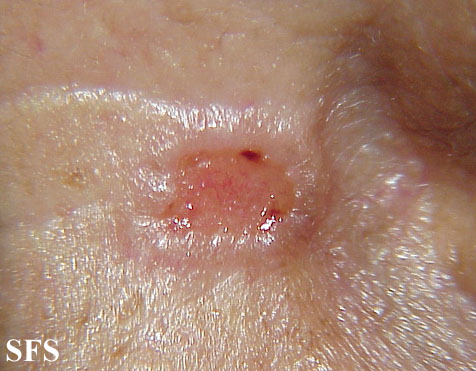

Label type: nine_partition_label
Label: malignant cutaneous lymphoma


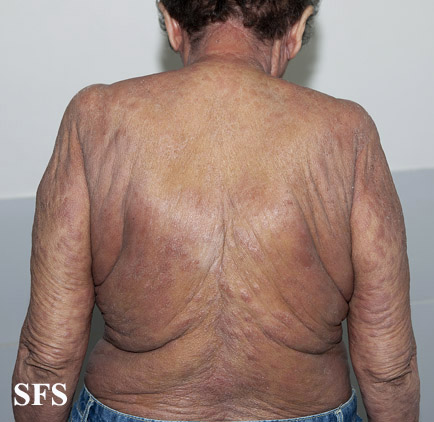

Label type: nine_partition_label
Label: benign epidermal


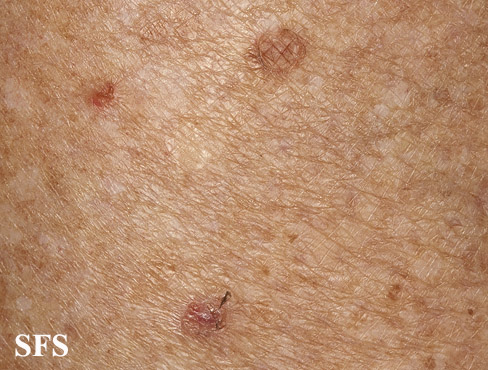

Label type: nine_partition_label
Label: malignant dermal


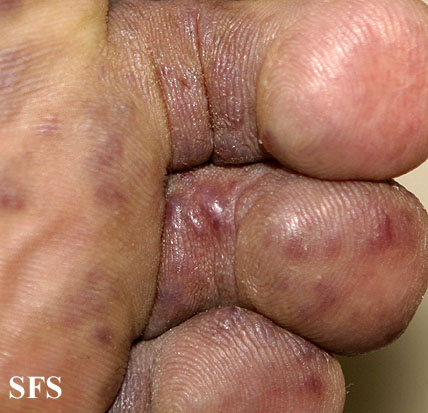

Label type: nine_partition_label
Label: benign melanocyte


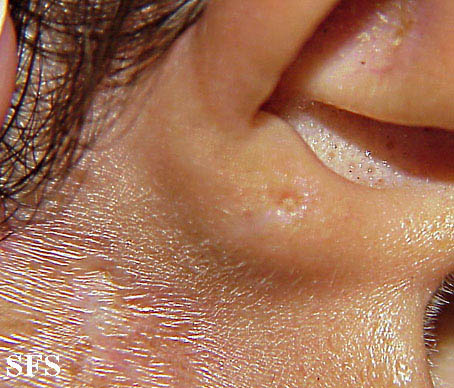

Label type: three_partition_label
Label: non-neoplastic


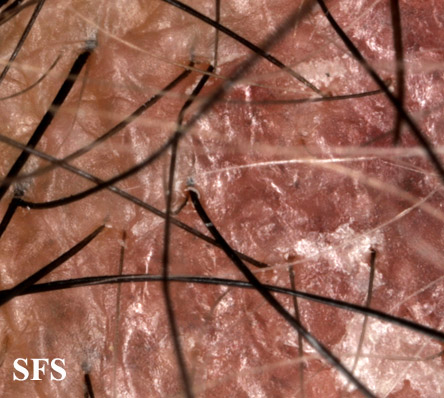

Label type: three_partition_label
Label: benign


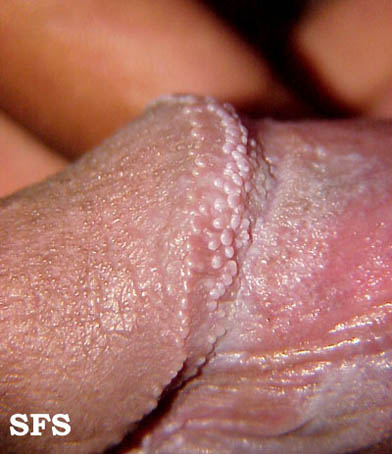

Label type: three_partition_label
Label: malignant


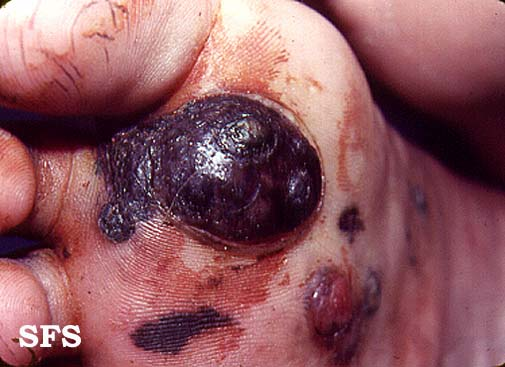

In [33]:
for col in lab_cols:
    if col == 'label':
        continue
    for label in fitz_csv_filt[col].unique():
        print(f"Label type: {col}")
        print(f"Label: {label}")
        sample_row = fitz_csv_filt[fitz_csv_filt[col]==label].sample(1)
        view_image(sample_row['filepath'].values[0], bucket)